In [1]:
import statsmodels
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import hvplot.xarray
import pandas as pd
from tqdm import tqdm
import scipy
from scipy import signal
from statsmodels.tsa import seasonal

plt.rcParams.update({
    'text.usetex':True,
    'font.family':'serif',
    'font.size':18
})

import seaborn as sns
# set the theme
sns.set_palette('inferno', 3)

## Look at changes due to depth

In [4]:
fn = '/datadrive/simulation/linear_arrivaltimechange_due2depth.nc'
depth_change = xr.open_dataarray(fn)

In [5]:
depth_change_201 = depth_change.rolling(time=201).mean().rename({'time':'dates'})
depth_change_601 = depth_change.rolling(time=601).mean().rename({'time':'dates'})
depth_change_1001 = depth_change.rolling(time=1001).mean().rename({'time':'dates'})

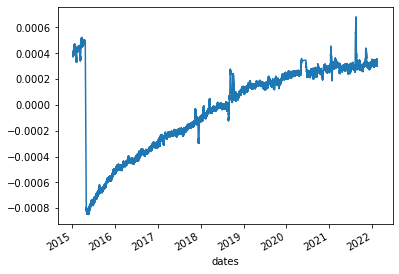

In [6]:
depth_change_201.plot()

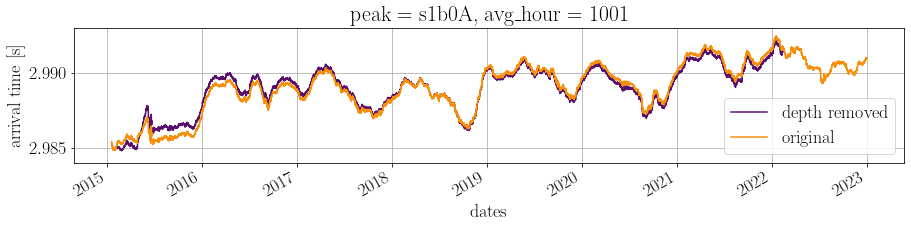

In [14]:
fig = plt.figure(figsize=(13,3.5))
((-1*arrival_times[4]) - depth_change_1001).plot(label='depth removed')
((-1*arrival_times[4])).plot(label='original', c='C2')
plt.ylim([2.984, 2.993])
plt.grid()
plt.legend()
plt.ylabel('arrival time [s]')

plt.tight_layout()
fig.savefig('figures/depth_adjusted.png', dpi=300)

## Time Series Decomposition

In [18]:
fn = '/datadrive/NCCFs/arrival_times/no_outlier_removal.nc'
da = xr.open_dataarray(fn)

In [19]:
# get id of first nan
nan_idx = np.argmin(np.isnan(da[4].values))
da_slice = da[4].interpolate_na(dim='dates')[nan_idx:]

Text(0, 0.5, 'arrival time')

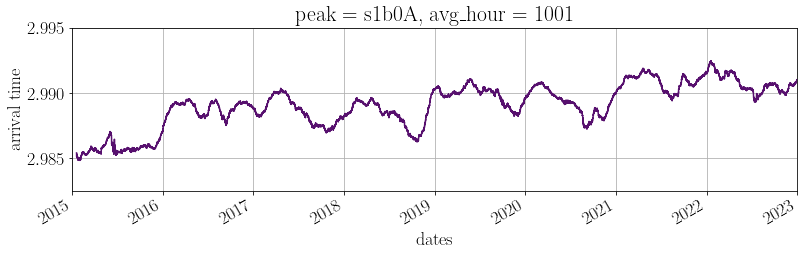

In [24]:
fig = plt.figure(figsize=(13,3))
(-1*da_slice).plot()
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])
plt.grid()
plt.ylim([2.9825, 2.995])
plt.ylabel('arrival time')

In [29]:
period = int(356.25 * 24)
res_1year = seasonal.seasonal_decompose((-1*da_slice.values), period=period)

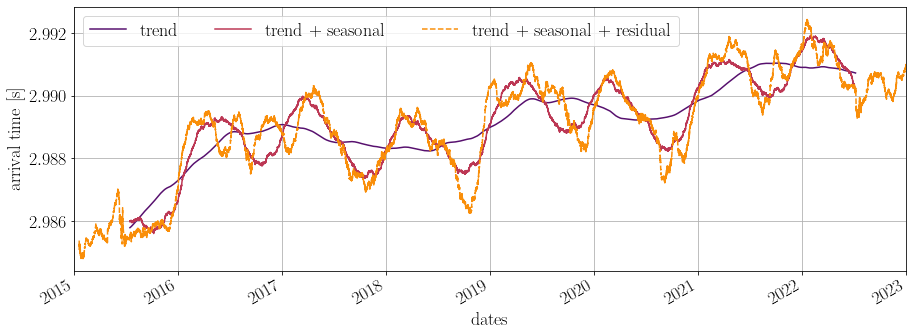

In [105]:
fig = plt.figure(figsize=(13,5))
#plt.plot(da_slice.dates, res_1year.resid + res_1year.trend,)
plt.plot(da_slice.dates, res_1year.trend, label='trend')
plt.plot(da_slice.dates, res_1year.trend + res_1year.seasonal, label='trend + seasonal')
plt.grid()
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])

(-1*da_slice).plot(label='trend + seasonal + residual', linestyle='--')
plt.legend(ncol=3)
plt.title('')

plt.tight_layout()
plt.ylabel('arrival time [s]')
fig.savefig('figures/ts_decop_overlay.png', dpi=300)

In [107]:
xticks = [pd.Timestamp('2015-01-01'), 
          pd.Timestamp('2016-01-01'), 
          pd.Timestamp('2017-01-01'), 
          pd.Timestamp('2018-01-01'), 
          pd.Timestamp('2019-01-01'), 
          pd.Timestamp('2020-01-01'), 
          pd.Timestamp('2021-01-01'), 
          pd.Timestamp('2022-01-01'), 
]

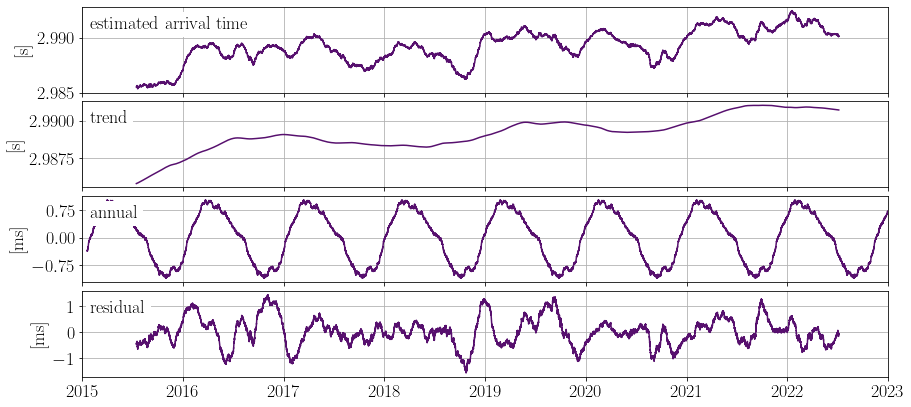

In [115]:
label_x = 0.01
label_y = 0.75

# Create a figure and subplots
fig, axes = plt.subplots(4, 1, figsize=(13, 6))

# Adjust the spacing between subplots
fig.subplots_adjust(hspace=0)

plt.sca(axes[0])
plt.plot(da_slice.dates, res_1year.trend + res_1year.seasonal + res_1year.resid)
plt.grid()
plt.ylabel('[s]')
text_box_props = dict(facecolor='white', edgecolor='white')
plt.text(label_x,label_y,'estimated arrival time', transform=axes[0].transAxes, bbox=text_box_props)
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])
axes[0].set_xticklabels('')

# Plot something in each subplot
plt.sca(axes[1])
axes[1].set_xticklabels('')
plt.plot(da_slice.dates, res_1year.trend)
plt.grid()
plt.ylabel('[s]')
text_box_props = dict(facecolor='white', edgecolor='white')
plt.text(label_x,label_y,'trend', transform=axes[1].transAxes, bbox=text_box_props)
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])

plt.sca(axes[2])
axes[2].set_xticklabels('')
plt.plot(da_slice.dates, res_1year.seasonal*1000)
plt.grid()
plt.ylabel('[ms]')
axes[2].set_yticks([0.75,0,-0.75])
text_box_props = dict(facecolor='white', edgecolor='white')
plt.text(label_x,label_y,'annual', transform=axes[2].transAxes, bbox=text_box_props)
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])


plt.sca(axes[3])
plt.plot(da_slice.dates, res_1year.resid*1000)
plt.grid()
plt.ylabel('[ms]')
text_box_props = dict(facecolor='white', edgecolor='white')
plt.text(label_x,label_y,'residual', transform=axes[3].transAxes, bbox=text_box_props)
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])

plt.tight_layout()

# Adjust the spacing between subplots
fig.subplots_adjust(hspace=0.1)

fig.savefig('figures/ts_decomp.png', dpi=300)

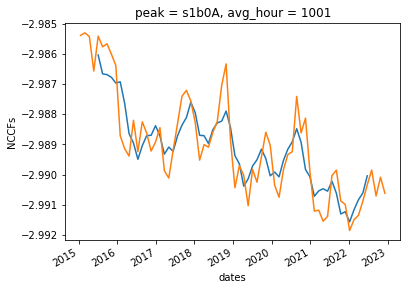

In [59]:
plt.plot(da_slice.dates, res_1year.trend + res_1year.seasonal)
da_slice.plot()

### Try Filtering out Year

In [43]:
# get id of first nan
nan_idx = np.argmin(np.isnan(arrival_times[0].values))
at_slice = -1*arrival_times[0].interpolate_na(dim='dates')[nan_idx:]

In [52]:
fcs=np.array([92.5926e-6, 134.4086e-6]) # 1/hr

In [73]:
arrival_time_ts10 = signal.decimate((at_slice), 10, zero_phase=True)
arrival_time_ts100 = signal.decimate(arrival_time_ts10, 10, zero_phase=True)

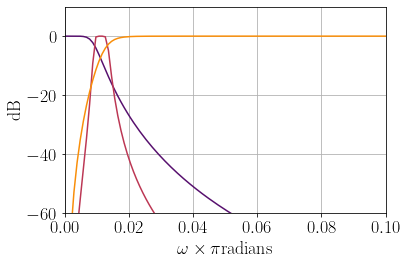

In [223]:
# Verify that decimation results in valid filter
fig = plt.figure()

ts = 100
fs = 1/ts

b1,a1 = signal.butter(4, fcs[0]/(fs/2), btype='lowpass')
b2,a2 = signal.butter(4, fcs/(fs/2), btype='bandpass')
b3,a3 = signal.butter(4, fcs[1]/(fs/2), btype='highpass')

w1,H1 = signal.freqz(b1,a1)
w2,H2 = signal.freqz(b2,a2)
w3,H3 = signal.freqz(b3,a3)

plt.plot(w1/(np.pi)/2, 20*np.log10(np.abs(H1)), label='filter 1')
plt.plot(w2/(np.pi)/2, 20*np.log10(np.abs(H2)), label='filter 2')
plt.plot(w3/(np.pi)/2, 20*np.log10(np.abs(H3)), label='filter 3')

plt.xlabel('1/hr')
plt.xlim([0,0.1])
plt.ylim([-60,10])
plt.grid()
plt.ylabel('dB')
plt.xlabel('$\omega \\times \pi \mathrm{radians}$')

plt.tight_layout()

fig.savefig('figures/filter_responses.png', dpi=300)

In [140]:
supannual = signal.filtfilt(b1,a1, arrival_time_ts100)
annual = signal.filtfilt(b2,a2,arrival_time_ts100)
subannual = signal.filtfilt(b3,a3,arrival_time_ts100)

In [146]:
plt.pl

(569679,)

In [179]:
subannual_f.shape

(10696,)

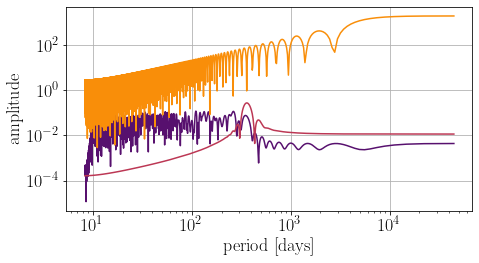

In [222]:
fig = plt.figure(figsize=(7,4))

supannual_f = np.abs(scipy.fft.fft((np.hstack((supannual, np.zeros(10000)))[1:])))
annual_f = np.abs(scipy.fft.fft((np.hstack((annual, np.zeros(10000)))[1:])))
subannual_f = np.abs(scipy.fft.fft((np.hstack((subannual, np.zeros(10000)))[1:])))

f = np.linspace(0,1/100, len(subannual_f))
t = 1/f[1:]

plt.plot(t[:int(len(subannual_f)/2)]/24, subannual_f[:int(len(subannual_f)/2)], label='residual')
plt.plot(t[:int(len(annual_f)/2)]/24, annual_f[:int(len(annual_f)/2)])
plt.plot(t[:int(len(supannual_f)/2)]/24, supannual_f[:int(len(subannual_f)/2)])

plt.xscale('log')
plt.yscale('log')
plt.grid()
plt.xlabel('period [days]')
plt.ylabel('amplitude')

plt.tight_layout()
fig.savefig('figures/filtered_spectrums.png', dpi=300)

(2.98, 3.0)

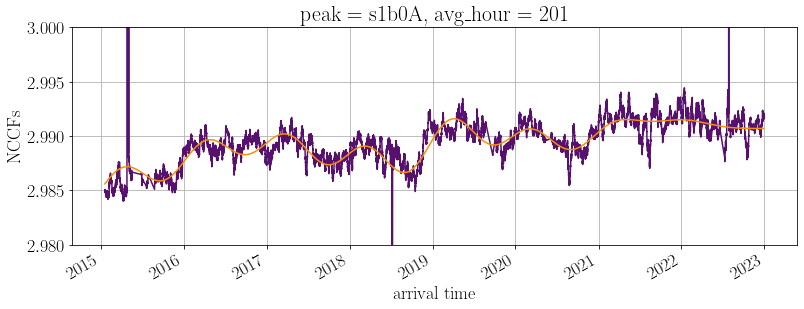

In [210]:
fig = plt.figure(figsize=(13,4))
at_slice.plot(label='estimated arrival time')
plt.plot(at_slice.dates[::100], supannual + annual + 0.068, c='C2', label='filtered arrival time')
plt.grid()
plt.xlabel('arrival time')


plt.ylim([2.98, 3])

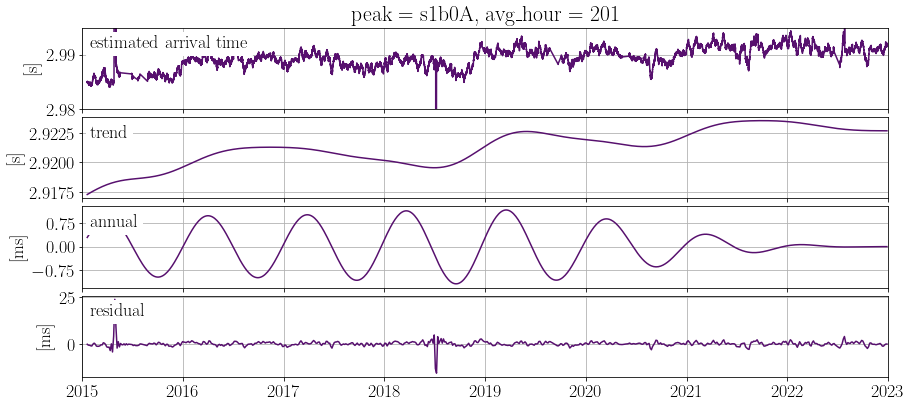

In [224]:
label_x = 0.01
label_y = 0.75

# Create a figure and subplots
fig, axes = plt.subplots(4, 1, figsize=(13, 6))

# Adjust the spacing between subplots
fig.subplots_adjust(hspace=0)

plt.sca(axes[0])
at_slice.plot(c='C0', label='estimated arrival time')
plt.grid()
plt.ylabel('[s]')
text_box_props = dict(facecolor='white', edgecolor='white')
plt.text(label_x,label_y,'estimated arrival time', transform=axes[0].transAxes, bbox=text_box_props)
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])
axes[0].set_xticklabels('')
plt.ylim([2.98, 2.995])

# Plot something in each subplot
plt.sca(axes[1])
axes[1].set_xticklabels('')
plt.plot(at_slice.dates[::100], supannual, c='C0', label='trend')
plt.grid()
plt.ylabel('[s]')
text_box_props = dict(facecolor='white', edgecolor='white')
plt.text(label_x,label_y,'trend', transform=axes[1].transAxes, bbox=text_box_props)
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])

plt.sca(axes[2])
axes[2].set_xticklabels('')
plt.plot(at_slice.dates[::100], annual*1000, c='C0', label='annual')
plt.grid()
plt.ylabel('[ms]')
axes[2].set_yticks([0.75,0,-0.75])
text_box_props = dict(facecolor='white', edgecolor='white')
plt.text(label_x,label_y,'annual', transform=axes[2].transAxes, bbox=text_box_props)
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])


plt.sca(axes[3])
plt.plot(at_slice.dates[::100], subannual*1000, c='C0', label='residual')
plt.grid()
plt.ylabel('[ms]')
text_box_props = dict(facecolor='white', edgecolor='white')
plt.text(label_x,label_y,'residual', transform=axes[3].transAxes, bbox=text_box_props)
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])

plt.tight_layout()

# Adjust the spacing between subplots
fig.subplots_adjust(hspace=0.1)

fig.savefig('figures/ts_decomp_filtering.png', dpi=300)

## Compute Spectrum

In [4]:
nan_idx = np.argmin(np.isnan(arrival_times.values[0,:]))
arrival_times_nonan = arrival_times.interpolate_na(dim='dates')[:,nan_idx:]
arrival_times_nm = arrival_times_nonan - arrival_times.mean('dates')

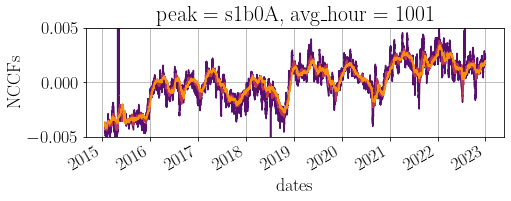

In [5]:
fig = plt.figure(figsize=(7.5, 2))
(-1*arrival_times_nm[0,:]).plot()
(-1*arrival_times_nm[2,:]).plot()
(-1*arrival_times_nm[4,:]).plot()
plt.ylim([-5e-3, 5e-3])
plt.grid()

In [6]:
Rxx = signal.fftconvolve(arrival_times_nm, np.flip(arrival_times_nm, axis=1), mode='full', axes=1)
arrival_times_f = scipy.fft.fft(np.hstack((Rxx, np.zeros((6,1000000)))), axis=1)
f = np.linspace(0,1,arrival_times_f.shape[1])

In [7]:
at_half = arrival_times_f[:, :int(arrival_times_f.shape[1]/2)]
f_half = f[:int(arrival_times_f.shape[1]/2)]
t_half = 1/f_half[1:]

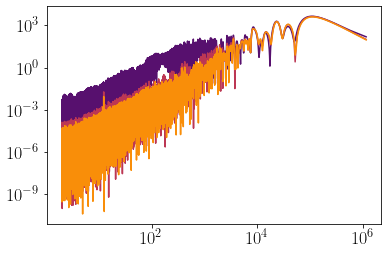

In [ ]:
plt.plot(t_half, np.abs(at_half[0,1:]))
plt.plot(t_half, np.abs(at_half[2,1:]))
plt.plot(t_half, np.abs(at_half[4,1:]))
plt.xscale('log')
plt.yscale('log')


In [120]:
#compute_windows
window_201 = np.zeros(t_half.shape)
window_201[int(len(window_201)/2)-100:int(len(window_201)/2)+100]  = 1

window_601 = np.zeros(t_half.shape)
window_601[int(len(window_601)/2)-300:int(len(window_601)/2)+300]  = 1

window_1001 = np.zeros(t_half.shape)
window_1001[int(len(window_1001)/2)-500:int(len(window_1001)/2)+500]  = 1

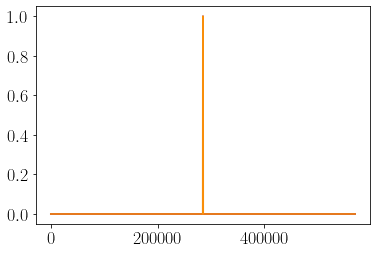

In [121]:
plt.plot(window_201)
plt.plot(window_601)
plt.plot(window_1001)

In [122]:
window_201f = scipy.fft.fft(window_201)
window_601f = scipy.fft.fft(window_601)
window_1001f = scipy.fft.fft(window_1001)

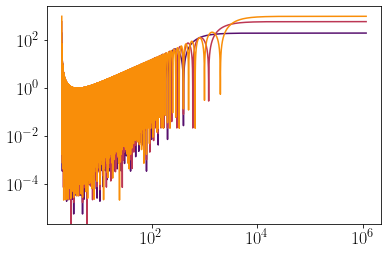

In [123]:
plt.plot(t_half, np.abs(window_201f))
plt.plot(t_half, np.abs(window_601f))
plt.plot(t_half, np.abs(window_1001f))
plt.yscale('log')
plt.xscale('log')

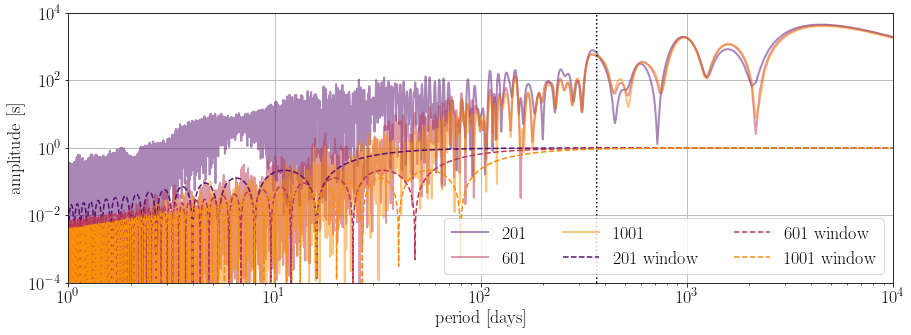

In [138]:
fig = plt.figure(figsize=(13,5))

plt.plot(t_half/24, np.abs(at_half[0,1:]), label='201', alpha=0.5, linewidth=2)
plt.plot(t_half/24, np.abs(at_half[2,1:]), label='601', alpha=0.5, linewidth=2)
plt.plot(t_half/24, np.abs(at_half[4,1:]), label='1001', alpha=0.5, linewidth=2)

plt.xscale('log')
plt.yscale('log')

plt.xlim([1e0, 1e4])
plt.ylim([1e-4, 1e4])


plt.plot([365.25, 365.24], [1e-4, 1e4], 'k:')

plt.plot(t_half/25, np.abs(window_201f)/np.max(np.abs(window_201f)), 'C0--', label = '201 window')
plt.plot(t_half/25, np.abs(window_601f)/np.max(np.abs(window_601f)), 'C1--', label = '601 window')
plt.plot(t_half/25, np.abs(window_1001f)/np.max(np.abs(window_1001f)), 'C2--', label = '1001 window')

plt.grid()
plt.xlabel('period [days]')
plt.ylabel('amplitude [s]')
#plt.xlim([3.1e2, 4.5e2])

plt.legend(ncol=3, loc='lower right')

plt.tight_layout()

fig.savefig('figures/arrival_time_spectrum_window.png', dpi=300)

## Look at HYCOM and estimated arrivals

In [2]:
## Load HYCOM simulation Results
at = -1*xr.open_dataset('/datadrive/simulation/caldera_inversion_timeseries_HYCOM2_at.nc')['temp_sim']

# remove outlier
at.loc[pd.Timestamp('2018-02-27T00:00:00')] = np.nan

# interpolate to 1 hour
time_coord = pd.date_range(pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01'), freq='H')
at_hr = at.interpolate_na(method='linear', dim='dates').interp(dates=time_coord, method='linear')

# add offset
at_hr = at_hr + 0.005
# Calculate averaged arrival times
at_201 = at_hr.rolling(dates=201, center=True, min_periods=100).mean()
at_601 = at_hr.rolling(dates=601, center=True, min_periods=300).mean()
at_1001 = at_hr.rolling(dates=1001, center=True, min_periods=500).mean()

In [3]:
## Load estimated arrival times

est_at = xr.open_dataset('/datadrive/NCCFs/arrival_times/outlier_removal_threshold_3.nc')['NCCFs']
est_at_201 = -1*est_at[0]
est_at_601 = -1*est_at[2]
est_at_1001 = -1*est_at[4]

In [4]:
at.hvplot(title='simulated arrival time with HYCOM', grid=True)

:Curve   [dates]   (temp_sim)

In [6]:
plot201 = at_201.hvplot(label='HYCOM', title='201 hour average', alpha=0.75) * est_at_201.hvplot(label='estimated arrival', title='201 hour average', alpha=0.75)
plot601 = at_601.hvplot(label='HYCOM', title='601 hour average', alpha=0.75) * est_at_601.hvplot(label='estimated arrival', title='601 hour average', alpha=0.75)
plot1001 = at_1001.hvplot(label='HYCOM', title='1001 hour average', alpha=0.75) * est_at_1001.hvplot(label='estimated arrival', title='1001 hour average', alpha=0.75)

In [7]:
(plot201 + plot601 + plot1001).cols(1)

:Layout
   .Overlay.I   :Overlay
      .Curve.HYCOM             :Curve   [dates]   (temp_sim)
      .Curve.Estimated_arrival :Curve   [dates]   (NCCFs)
   .Overlay.II  :Overlay
      .Curve.HYCOM             :Curve   [dates]   (temp_sim)
      .Curve.Estimated_arrival :Curve   [dates]   (NCCFs)
   .Overlay.III :Overlay
      .Curve.HYCOM             :Curve   [dates]   (temp_sim)
      .Curve.Estimated_arrival :Curve   [dates]   (NCCFs)